# Visualizing High-Dimensional Data

by [Ali Akbar Septiandri](https://twitter.com/__aliakbars__)

<img src="http://pycon.id/images/pyconid2019_logo.png" width="20%">

In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

# Digit Recognition

In [2]:
from sklearn.datasets import load_digits
import altair as alt

X, y = load_digits(return_X_y=True)

def draw_digits(X, y):
    data = pd.DataFrame({
        'x1': X[:,0],
        'x2': X[:,1],
        'label': y,
    })
    
    if data.shape[0] > 5000:
        data = data.sample(5000, random_state=42)
    
    return alt.Chart(data).mark_point().encode(
        x='x1',
        y='x2',
        color='label:N'
    ).properties(
        width=400,
        height=400
    ).interactive()

## Prinicipal Component Analysis (PCA)

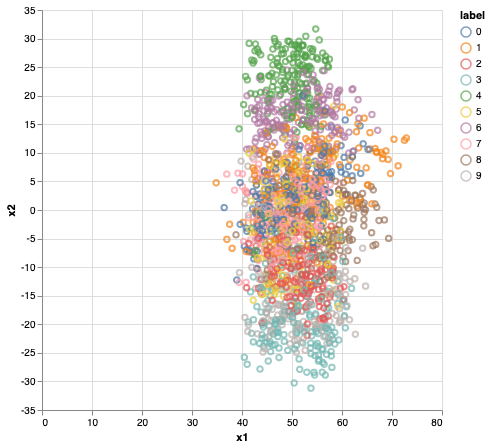

In [3]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(2, random_state=42)
X_svd = svd.fit_transform(X)
draw_digits(X_svd, y)

## t-Distributed Stochastic Neighbor Embedding (t-SNE)

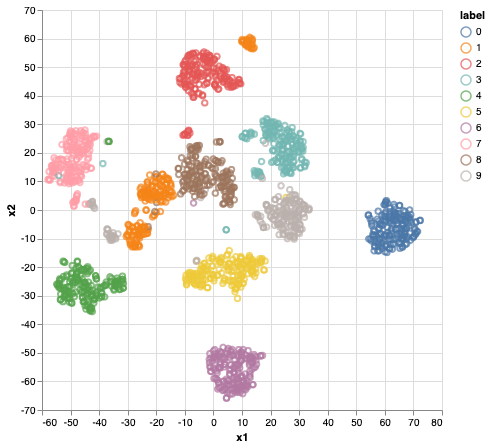

In [4]:
from sklearn.manifold import TSNE

dim_red = TSNE(random_state=42)
X_dim = dim_red.fit_transform(X)
draw_digits(X_dim, y)

## Uniform Manifold Approximation and Projection (UMAP)

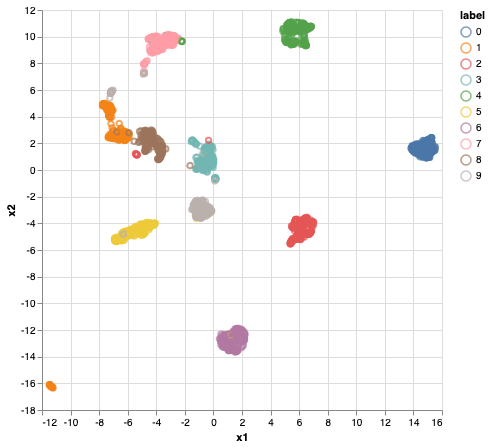

In [5]:
from umap import UMAP

dim_red = UMAP(random_state=42)
X_dim = dim_red.fit_transform(X)
draw_digits(X_dim, y)

# Fashion MNIST

<img src="https://raw.githubusercontent.com/zalandoresearch/fashion-mnist/master/doc/img/fashion-mnist-sprite.png" width="75%">

In [3]:
import tensorflow as tf

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()

## PCA

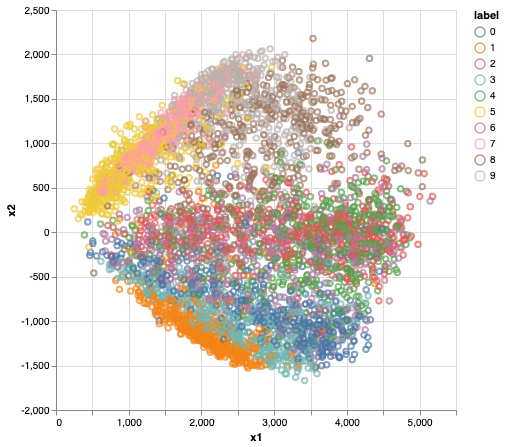

In [6]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(2, random_state=42)
X_svd = svd.fit_transform(x_test.reshape(-1, 784))
draw_digits(X_svd, y_test)

## t-SNE

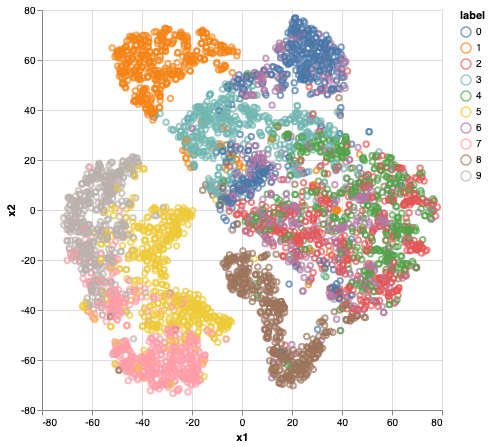

In [8]:
from sklearn.manifold import TSNE

dim_red = TSNE(random_state=42)
X_dim = dim_red.fit_transform(x_test.reshape(-1, 784))
draw_digits(X_dim, y_test)

## UMAP

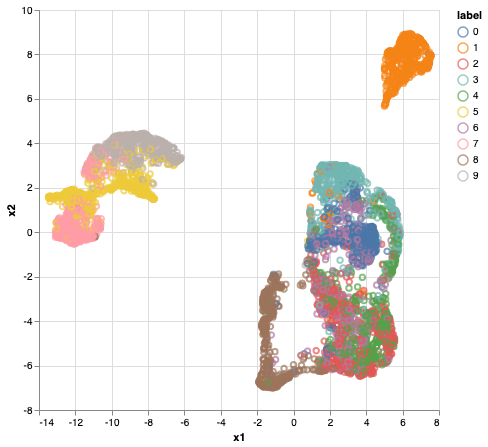

In [9]:
from umap import UMAP

dim_red = UMAP(random_state=42)
X_dim = dim_red.fit_transform(x_test.reshape(-1, 784))
draw_digits(X_dim, y_test)

# Names

In [10]:
df = pd.read_csv('alumni.csv', names=['name','gender']).dropna().sample(1000, random_state=42)

In [11]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer(token_pattern='\\w', ngram_range=(3,3))
X = vec.fit_transform(df['name'])
print('# rows: {}, # cols: {}'.format(*X.shape))

# rows: 1000, # cols: 2740


In [12]:
import altair as alt

def draw_2d(X, df):
    return alt.Chart(pd.DataFrame({
        'x1': X[:,0],
        'x2': X[:,1],
        'gender': df['gender'].map({0: 'female', 1: 'male'}),
        'name': df['name']
    })).mark_point().encode(
        x='x1',
        y='x2',
        color='gender',
        tooltip='name'
    ).properties(
        width=400,
        height=400
    ).interactive()

## PCA

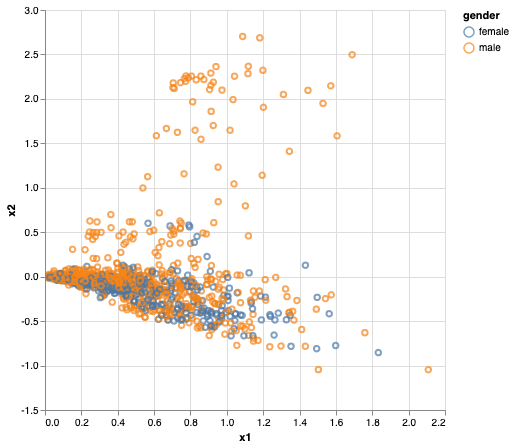

In [13]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(2, random_state=42)
X_svd = svd.fit_transform(X)
draw_2d(X_svd, df)

## t-SNE

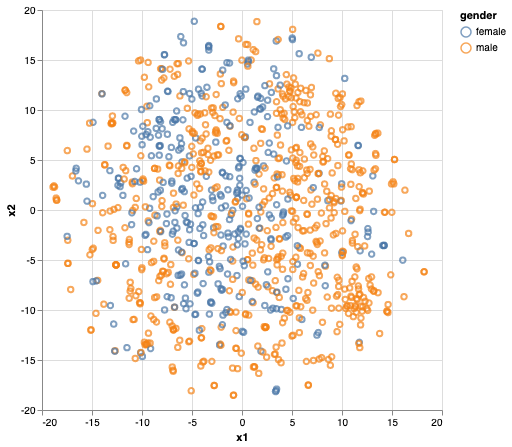

In [14]:
from sklearn.manifold import TSNE

dim_red = TSNE(perplexity=100, metric='cosine', random_state=42)
X_dim = dim_red.fit_transform(X.toarray())
draw_2d(X_dim, df)

## UMAP

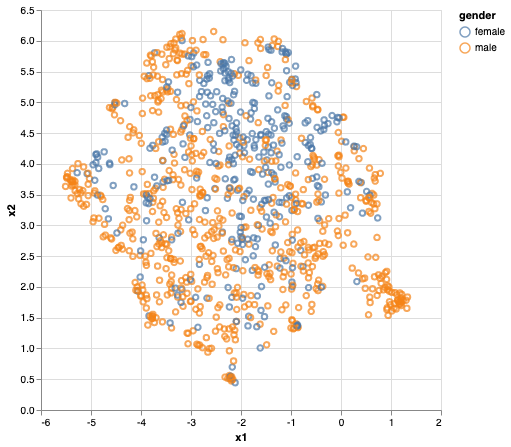

In [15]:
from umap import UMAP

dim_red = UMAP(n_neighbors=30, metric='cosine', random_state=42)
X_dim = dim_red.fit_transform(X.toarray())
draw_2d(X_dim, df)

# 20 Newsgroups

In [16]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer

categories = [
    'alt.atheism',
    'soc.religion.christian',
    'comp.sys.ibm.pc.hardware',
    'comp.windows.x',
    'rec.sport.baseball',
    'rec.sport.hockey',
]
df = fetch_20newsgroups(
    subset='train',
    remove=('headers', 'footers', 'quotes'),
    categories=categories
)
text = df['data']
label = pd.Series(df['target']).map(dict(enumerate(df['target_names'])))

vec = CountVectorizer(stop_words='english', min_df=3)
X = vec.fit_transform(text)
print('# rows: {}, # cols: {}'.format(*X.shape))

# rows: 3459, # cols: 11374


In [17]:
import altair as alt

def draw_news(X, text, label):
    data = pd.DataFrame({
        'x1': X[:,0],
        'x2': X[:,1],
        'text': text,
        'label': label
    })
    
    return alt.Chart(data).mark_point().encode(
        x='x1',
        y='x2',
        color='label',
        tooltip='text'
    ).properties(
        width=400,
        height=400
    ).interactive()

## PCA

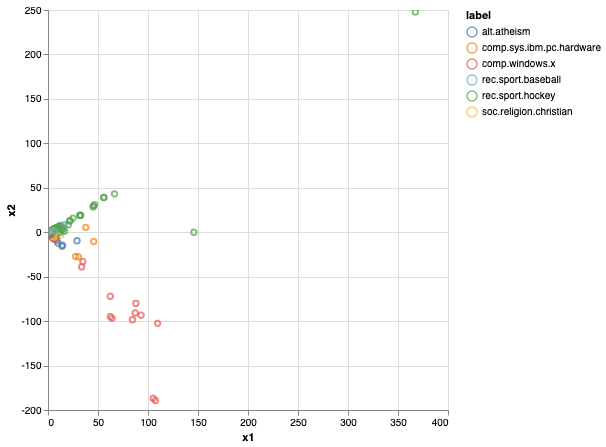

In [18]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(2, random_state=42)
X_svd = svd.fit_transform(X)
draw_news(X_svd, text, label)

## t-SNE

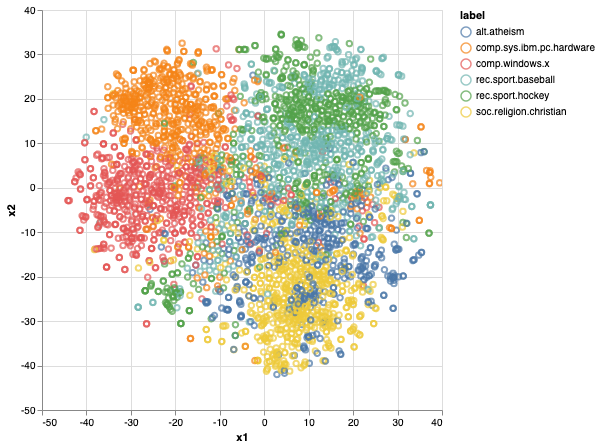

In [19]:
from sklearn.manifold import TSNE

dim_red = TSNE(perplexity=100, metric='cosine', random_state=42)
X_dim = dim_red.fit_transform(X.toarray())
draw_news(X_dim, text, label)

## UMAP

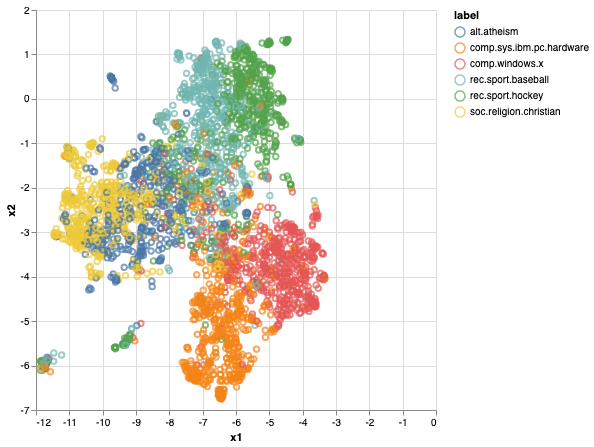

In [20]:
from umap import UMAP

dim_red = UMAP(metric='cosine', random_state=42)
X_dim = dim_red.fit_transform(X.toarray())
draw_news(X_dim, text, label)

# How to (mis)read UMAP

Taken from [Understanding UMAP](https://pair-code.github.io/understanding-umap/):

1. Hyperparameters really matter
2. Cluster sizes in a UMAP plot mean nothing
3. Distances between clusters might not mean anything
4. Random noise doesn’t always look random
5. You may need more than one plot

# Another Technique: Autoencoder

<img src="https://tentangdata.files.wordpress.com/2017/10/autoencoder_pca_viz.png?w=2016" width="65%">

Applying autoencoder (top) and PCA (bottom) to MNIST dataset

# Key Takeaways

1. **PCA** is the **fastest**, the axes are **interpretable** (eigenvectors) – try this first!
2. **PCA failed** to keep the topological structure when projecting the data **into 2D** for high-dimensional data
3. Alternatives: **t-SNE and UMAP**
4. UMAP is **faster** than t-SNE
5. With t-SNE and UMAP, you **can only interpret the clusters**

# References

1. Powell, V. and Lehe, L., 2015. [Principal Component Analysis](http://setosa.io/ev/principal-component-analysis/). *Explained Visually*.
2. Wattenberg, M., Viégas, F. and Johnson, I., 2016. [How to use t-SNE effectively](https://distill.pub/2016/misread-tsne/). *Distill, 1*(10), p.e2.
3. Coenen, A. and Pearce, A., 2019. [Understanding UMAP](https://pair-code.github.io/understanding-umap/). *Google PAIR*.
5. Xiao, H., Rasul, K. and Vollgraf, R., 2017. Fashion-MNIST: a novel image dataset for benchmarking machine learning algorithms. *arXiv preprint arXiv:1708.07747.*
6. Wibisono, O., 2017. [Autoencoder: Alternatif PCA yang Lebih Mumpuni](https://tentangdata.wordpress.com/2017/10/14/autoencoder-alternatif-pca-yang-lebih-mumpuni/). *Cerita Tentang Data*.
7. Chollet, F., 2016. [Building autoencoders in Keras](https://blog.keras.io/building-autoencoders-in-keras.html). *The Keras Blog*.

# Thank you!

<img src="https://cdn-images-1.medium.com/max/1200/1*RgQag1tZvOhc4026iEXs2w.png" width="20%">

Ali Akbar Septiandri<br>
Twitter: [@\_\_aliakbars\_\_](https://twitter.com/__aliakbars__)<br>
E-mail: ali.septiandri@airy.com<br>
Blog: https://medium.com/airy-science

[![forthebadge made-with-python](http://ForTheBadge.com/images/badges/made-with-python.svg)](https://www.python.org/)